In [1]:
import numpy as np
import zarr
from PIL import Image
from IPython.display import display
from tqdm.notebook import tqdm, trange

from gltfraytracer import Scene3D

In [2]:
# Pupil plane
n_p = 32
size_p = 8.0
pitch_p = size_p / n_p
z_p = 0.0

# View plane
n_v = 1440
size_v = 360.0
pitch_v = size_v / n_v
z_v = 176.0

# Field of view
fov_factor = (size_v - size_p) / z_v
fov = 2 * np.arctan(fov_factor / 2) * 180/np.pi

# Retina estimate
lf_n_r = n_v - n_p

print('[Sampled Light Field]')
print('Pupil Plane:     {:4} × {:4.2f} mm = {:5} mm         \t    z_p = {:5} mm'.format(n_p, pitch_p, size_p, z_p))
print('View Plane:      {:4} × {:4.2f} mm = {:5} mm         \t    z_v = {:5} mm'.format(n_v, pitch_v, size_v, z_v))
print('Retina Estimate: {:7.2f} samples over FoV = {:4.1f}° \t z_near = {:5} mm'.format(lf_n_r, fov, z_v/2))

print('\nNumber of rays: {:,}'.format((n_p * n_v)**2))

[Sampled Light Field]
Pupil Plane:       32 × 0.25 mm =   8.0 mm         	    z_p =   0.0 mm
View Plane:      1440 × 0.25 mm = 360.0 mm         	    z_v = 176.0 mm
Retina Estimate: 1408.00 samples over FoV = 90.0° 	 z_near =  88.0 mm

Number of rays: 2,123,366,400


In [3]:
def array_stats(a):
    print('{} × {} = {} GiB | min: {}, avg: {}, max: {}'.format(a.shape, a.dtype, a.nbytes/2**30, np.amin(a), np.amax(a), np.average(a)))

def sampling_lattice(n, pitch=1.0):
    return (np.arange(n, dtype=np.float32) - (n - 1)/2) * pitch
    
def display_image(values):
    display(Image.fromarray((np.flip(values.T, axis=0) * 255.0).astype(np.uint8)))

def dot(a, b):
    return np.einsum('...i,...i', a, b)

In [4]:
lattice_p = sampling_lattice(n_p, pitch_p)
lattice_v = sampling_lattice(n_v, pitch_v)

Casting rays...


  0%|          | 0/1440 [00:00<?, ?it/s]

Type,zarr.core.Array
Data type,float32
Shape,"(3, 32, 1440, 32, 1440)"
Chunk shape,"(1, 1, 1, 32, 1440)"
Order,C
Read-only,False
Compressor,"Blosc(cname='lz4', clevel=5, shuffle=SHUFFLE, blocksize=0)"
Store type,zarr.storage.DirectoryStore
No. bytes,25480396800 (23.7G)
No. bytes stored,18694328310 (17.4G)
Storage ratio,1.4


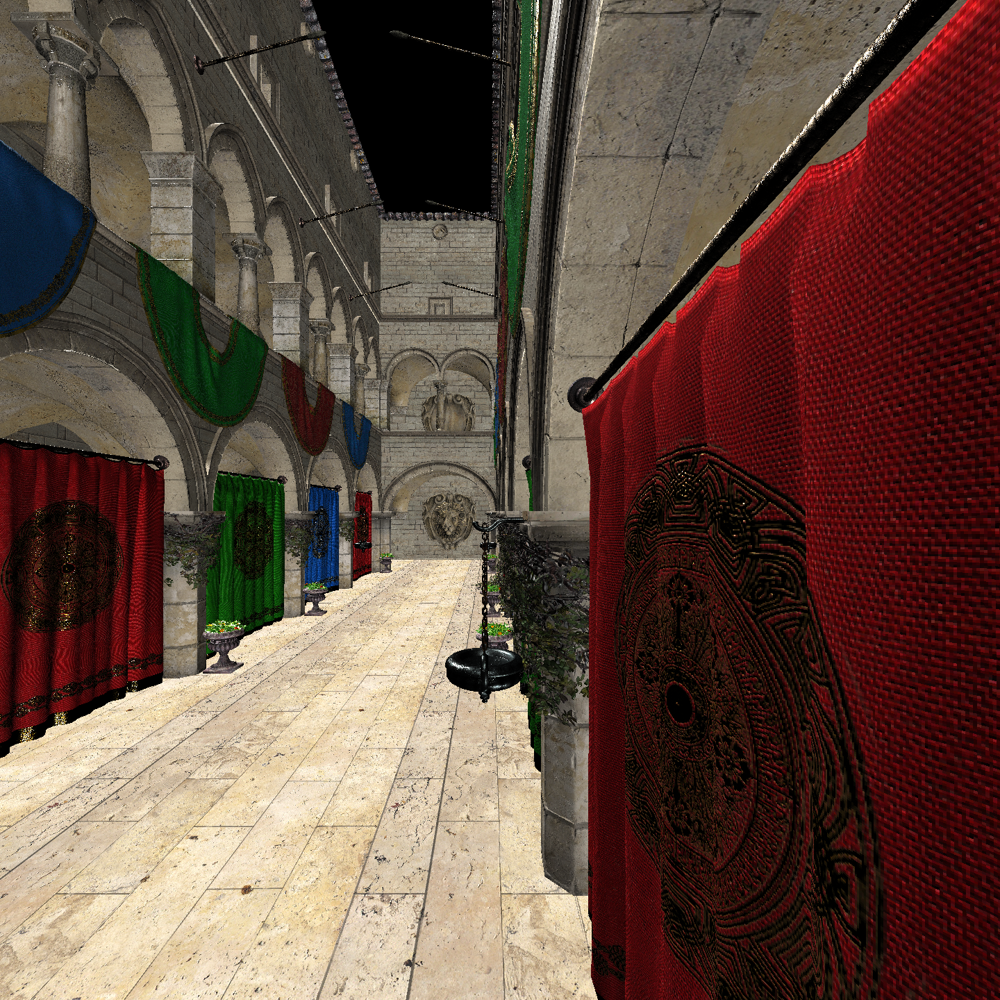

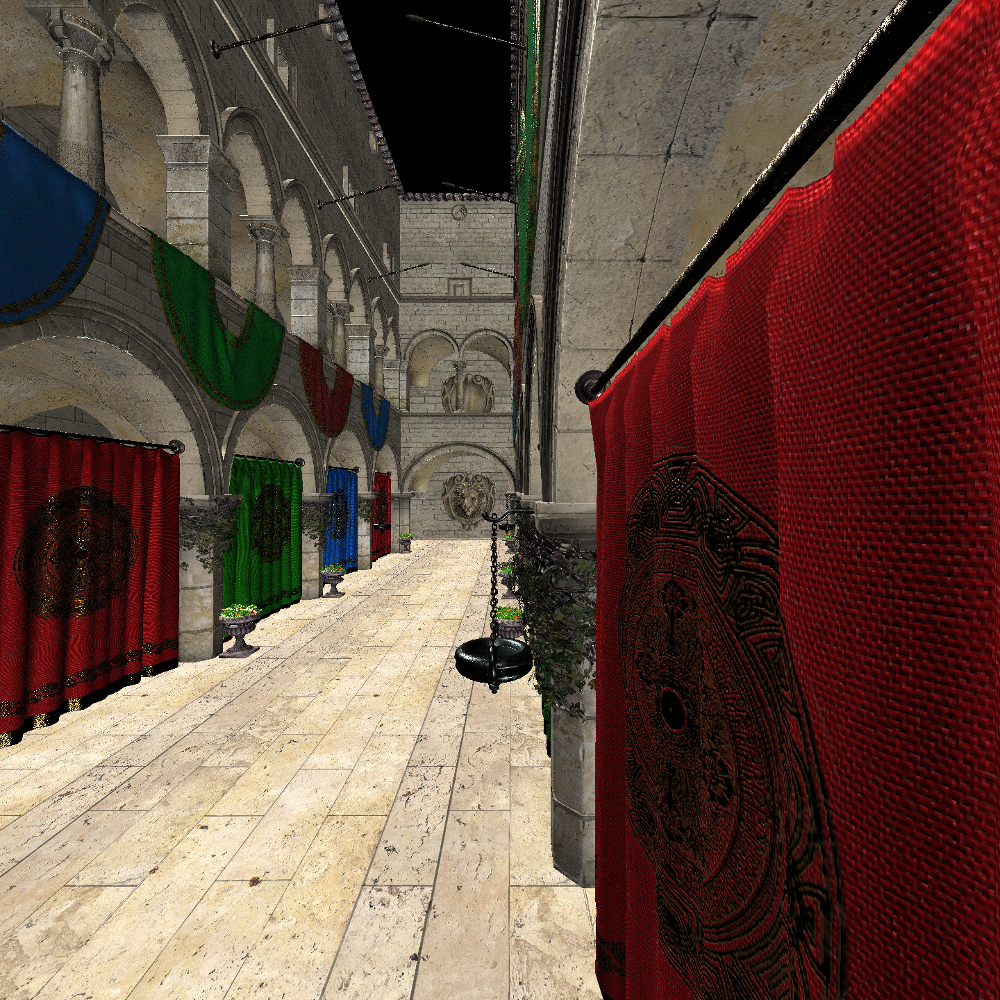

Wall time: 2h 42min 57s


In [5]:
%%time
print('Casting rays...')

light_field = zarr.open('data/sponza_sampled.zarr', mode='w', shape=(3, n_p, n_v, n_p, n_v), chunks=(1, 1, 1, n_p, n_v), dtype=np.float32)

light_values = np.array([[1.2, 1.2, 1.2], [0.8, 0.8, 0.8], [0.6, 0.6, 0.6]])
light_directions = np.array([[0.5, -0.7, 0.5], [-0.5, 0.7, -0.5], [0.0, -0.7, -0.7]])
light_directions /= np.sqrt(dot(light_directions, light_directions))[..., np.newaxis]

rotation = np.array([[0.0, 0.0, 1.0],
                     [0.0, 1.0, 0.0],
                     [1.0, 0.0, 0.0]])

translation = np.array([-150.0, -225.0, -800.0])

scene = Scene3D('../models/gltf/sponza/Sponza.gltf', rotation, translation)

for index_v in trange(n_v):
    ray_origins    = np.tile(np.stack(np.broadcast_arrays(lattice_p.reshape(n_p, 1, 1), lattice_p.reshape(1, n_p, 1), -z_p), axis=-1), (  1,   1, n_v, 1)).reshape(-1, 3)
    ray_directions = np.tile(np.stack(np.broadcast_arrays(lattice_v[index_v]          , lattice_v.reshape(1, 1, n_v), -z_v), axis=-1), (n_p, n_p,   1, 1)).reshape(-1, 3) - ray_origins
    ray_directions /= np.sqrt(dot(ray_directions, ray_directions))[..., np.newaxis]

    # Ray cast scene.
    ray_colors = np.moveaxis(scene.rayCast(ray_origins, ray_directions, light_values, light_directions), -1, 0).reshape(3, n_p, n_p, n_v).astype(np.float32)

    # Clip ray values inside [0, 1].
    ray_colors = np.clip(ray_colors, 0.0, 1.0)

    # Store ray values.
    light_field[:, :, index_v, :, :] = ray_colors

scene.release()

display(light_field.info)

display_image(light_field[:,  0, :,  0, :])
display_image(light_field[:, -1, :, -1, :])